In [1]:
#import libraries
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split, GridSearchCV

In [2]:
#import dataset
forest_df = pd.read_csv("forestfires.csv")
forest_df.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small


## EDA

In [3]:
#Check for NA 
forest_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

### Dataset has no null values

In [4]:
#Check for duplicate rows
forest_df[forest_df.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
53,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
100,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,...,0,0,0,0,0,0,0,0,0,small
215,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,...,0,0,0,0,1,0,0,0,0,large
303,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,...,0,0,0,1,0,0,0,0,0,small
426,aug,thu,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,...,0,0,0,0,0,0,0,0,0,small
461,aug,sat,93.7,231.1,715.1,8.4,18.9,64,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
501,aug,tue,96.1,181.1,671.2,14.3,21.6,65,4.9,0.8,...,0,0,0,0,0,0,0,0,0,small
508,aug,fri,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,...,0,0,0,0,0,0,0,0,0,small


### Dataset above set of duplicate rows

In [5]:
#Delete dulicate rows
forest_df.drop_duplicates(inplace=True, ignore_index=True)

<AxesSubplot:>

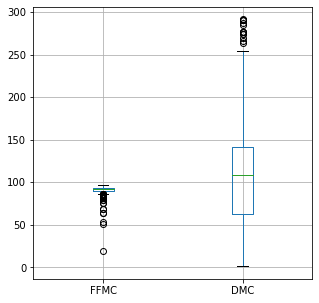

In [6]:
#Check for outliers
forest_df.boxplot(column=["FFMC","DMC"], figsize=(5,5))

In [7]:
#delete outliers
forest_df_eda = forest_df.drop(forest_df[forest_df["FFMC"] < 70].index, axis=0)
forest_df_eda = forest_df_eda.drop(forest_df_eda[forest_df_eda["DMC"] > 260].index, axis=0)
forest_df_eda.reset_index(drop=True, inplace=True)

In [9]:
#As days of the week doesnot contibute to the output
forest_df_eda1 = forest_df_eda.drop(["dayfri","daymon","daysat", "daysun","daythu","daytue","daywed"], axis=1)

In [10]:
#Data splitting
from sklearn.preprocessing import LabelEncoder
x = forest_df_eda1.iloc[:,2:-1]
y = LabelEncoder().fit_transform(forest_df_eda1.iloc[:,-1])

In [11]:
#Data standerisation and spliting into test data
from sklearn.preprocessing import StandardScaler
x_std = StandardScaler().fit_transform(x)

In [12]:
#training and test data
x_train, x_test, y_train, y_test = train_test_split(x_std,y, test_size = 0.2, random_state=0)

In [13]:
x_train.shape

(388, 21)

## Model

In [14]:
#create function for parameter tuning
def create_model(neuron1, init, activation_function, dropout_rate, neuron2, learning_rate):
    model = Sequential()
    model.add(Dense(neuron1, input_dim=21, kernel_initializer = init, activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neuron2, kernel_initializer = init, activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation = "sigmoid"))
    
    adam =Adam(learning_rate=learning_rate)
    model.compile(loss="binary_crossentropy",optimizer=adam, metrics = "accuracy")
    return model

In [15]:
#Model for validation
model1 = KerasClassifier(build_fn=create_model,verbose=0)

#Grid search parameters
neuron1 = [10,15,20]
neuron2 = [10,15,20]
init = ["normal", "uniform", "zero"]
activation_function = ["relu", "tanh", "linear"]
dropout_rate = [0.0, 0.1, 0.2]
learning_rate = [0.001, 0.01, 0.1]
batch_size = [10,20,40]
epochs = [10,50,100]

#Dictionary of gridsearch parameters
para_grid = dict(batch_size = batch_size, epochs = epochs, learning_rate = learning_rate,dropout_rate = dropout_rate,
                   activation_function = activation_function, init = init, neuron1 = neuron1, neuron2 = neuron2)

#Build Gridsearch CV and fit
gsv = GridSearchCV(estimator=model1, param_grid=para_grid,verbose=10)
gsv.fit(x_train,y_train)

Fitting 5 folds for each of 6561 candidates, totalling 32805 fits
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.756, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.782, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.6s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.769, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.3s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.792, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    3.0s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.8s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.756, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    4.5s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.808, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    5.1s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    5.7s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.818, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    6.6s remaining:    0.0s


[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.782, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.795, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.782, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.805, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.909, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.872, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.795, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.821, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.753, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.782, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.782, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.844, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.897, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.923, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.896, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   1.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.885, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.769, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.859, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.833, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.936, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.935, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.948, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.885, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.949, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.961, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.808, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.740, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.808, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.948, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.948, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.910, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.987, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.896, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.872, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.769, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.846, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.910, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.974, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.936, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.961, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.909, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.872, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.948, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.897, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.779, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.833, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.935, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.885, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.949, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.935, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.909, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.846, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.808, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.769, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.740, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.795, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.782, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.805, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.896, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.857, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.885, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.782, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.727, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.782, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.744, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.818, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.701, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.756, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.808, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.935, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.885, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.949, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.792, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.769, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.909, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.859, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.805, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.701, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.948, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.909, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.821, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.923, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.962, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.962, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.948, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.935, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.872, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuro

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.740, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.987, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.896, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.808, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.808, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.727, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, 

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.727, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.769, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.821, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.756, total=   1.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.831, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.857, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.859, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.821, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.756, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.727, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.782, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.756, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.795, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.792, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.808, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.923, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.896, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.727, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.833, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.727, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total= 1.5min
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.896, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.870, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.910, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.949, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.935, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.909, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.897, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.896, total=   2.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.782, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.831, total=   3.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   3.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.961, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.948, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.962, total=   1.9s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.808, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   1.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.795, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   1.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766,

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.936, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.949, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=1.000, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.974, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.961, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.872, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.922, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.897, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.727, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.936, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.922, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.961, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.922, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.818, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   2.1s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   2.7s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   2.8s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   2.5s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   2.3s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score

[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   2.2s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   2.6s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   2.4s
[CV] activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.769, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.744, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.870, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.818, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.808, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.923, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.857, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.833, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.795, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.883, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.756, total=   1.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.692, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.818, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.756, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.923, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.870, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.872, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.910, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.897, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.936, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.909, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.859, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.896, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.883, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.692, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.910, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.857, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.870, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neur

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.872, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.949, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.922, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.821, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.910, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.974, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.922, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.910, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.962, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.948, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.909, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.859, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.949, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.923, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.844, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.795, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.872, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.870, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.909, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.948, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.922, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.885, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.923, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.896, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.857, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.744, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.910, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.821, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.909, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.779, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.872, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.744, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.859, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.883, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.833, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.808, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.833, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.769, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.818, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.846, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.897, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.808, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.818, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.779, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.782, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.833, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.859, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.870, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.833, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.923, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.935, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.961, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.808, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.885, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.870, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.846, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   2.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.896, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.922, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.846, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.870, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.821, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.846, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.805, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.792, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, sc

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.923, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.948, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.923, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.949, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.949, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.883, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.859, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.910, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.974, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.948, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.962, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.961, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.896, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.885, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.948, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.896, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.833, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.795, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.779, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.744, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.885, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.897, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.896, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.859, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.897, total=   1.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.897, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.821, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.769, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.844, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.818, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.779, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.821, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.885, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.896, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.857, total=   0.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.795, total=   1.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.818, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.833, total=   2.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.910, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.897, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.883, total=   2.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.883, total=   2.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.910, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, 

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.949, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.961, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.909, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.885, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.885, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.883, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.756, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.795, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.883, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.883, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.872, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.949, total=   1.5s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.870, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.846, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.831, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.740, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.7

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   1.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.3s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731,

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.974, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.910, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.962, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.909, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.846, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.923, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.782, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.795, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.949, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.948, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.974, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.910, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.936, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.961, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.909, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.923, total=   2.2s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   2.4s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.808, total=   1.9s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.909, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.701, total=   2.1s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   2.0s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   1.6s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.8s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.779, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.779, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.779, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.744, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.805, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.701, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.795, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.846, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.872, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.857, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.792, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.808, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.897, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.872, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.883, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.818, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.808, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.846, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.857, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.857, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.846, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.857, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.753, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.821, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.870, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.844, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.846, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.795, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.805, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.846, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.779, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.701, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.779, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.701, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.692, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.701, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.821, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.846, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.859, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.883, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.818, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.769, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.833, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.859, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.870, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.792, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.821, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.846, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.872, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.896, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.792, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.872, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.846, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.740, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.795, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.833, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.831, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.805, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.833, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.795, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.701, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.818, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.679, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.833, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.821, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.857, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, scor

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.870, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.740, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.859, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.872, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.857, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.779, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.833, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.846, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.885, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.792, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.821, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.897, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.859, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.831, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.872, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.949, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.948, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.870, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.885, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.935, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.896, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.961, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.909, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.896, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.808, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.872, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.844, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.846, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.909, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.883, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.808, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.897, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.923, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.961, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.727, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.795, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.846, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.792, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.808, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.885, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.859, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.792, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.808, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.885, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.872, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.883, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.818, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.949, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.935, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.885, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.883, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.885, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.948, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.872, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.949, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.948, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.896, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.885, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.922, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.831, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.885, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.885, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.922, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.909, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.846, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.922, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.870, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuro

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.896, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.896, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.872, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.909, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.833, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.935, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.909, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.846, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.909, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.909, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.872, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuro

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.922, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.909, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.859, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.872, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.923, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.896, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.846, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.808, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.909, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.909, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.821, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.923, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.949, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.909, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.857, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.808, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.910, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.896, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.818, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.897, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.897, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.909, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.909, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.833, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.923, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.909, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.885, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.935, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.922, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.872, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.949, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.935, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.896, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.872, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.949, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.961, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.885, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.909, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.859, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.961, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.872, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.949, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.883, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.896, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.872, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.923, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.872, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.857, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.883, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.821, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.948, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.808, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.910, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.885, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.857, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.896, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.779, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.883, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.805, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.833, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.846, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.846, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.779, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.833, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.872, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.805, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.872, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.883, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.753, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.782, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.859, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.859, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.857, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.792, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.846, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.885, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.831, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.701, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.846, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.795, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.818, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.833, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.779, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.779, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.688, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.779, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.833, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.859, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.872, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.870, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.792, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.833, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.833, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.846, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.831, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.846, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.846, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.870, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.795, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.859, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.831, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.818, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.769, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.844, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.844, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.769, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.782, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.805, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.740, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.821, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.897, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.795, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.808, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.740, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.846, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.808, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.846, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.870, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.805, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.833, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.846, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.872, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.870, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.792, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.846, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.885, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.883, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.885, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.949, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.922, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.870, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.859, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.909, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.923, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.910, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.896, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.885, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.885, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.883, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.870, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.821, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.936, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.923, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.844, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.909, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.885, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.923, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.821, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.727, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.808, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.821, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.846, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.821, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.846, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.872, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.753, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.833, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.859, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.885, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.883, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.831, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.897, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.987, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.909, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.885, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.857, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.872, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.909, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.821, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.923, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.897, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.935, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.833, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.833, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.883, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.883, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.833, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.883, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.805, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.808, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.910, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, sc

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.949, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.883, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.897, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.936, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.936, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.896, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.897, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.909, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.909, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.846, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.962, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.949, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.948, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.922, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.897, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.896, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.922, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.859, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.922, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.859, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, ne

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.949, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.909, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.870, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.885, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.883, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.909, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.833, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.948, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.922, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.897, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.896, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.844, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.885, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.909, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.870, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.885, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.936, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.948, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.896, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.885, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.949, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.948, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.922, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.910, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.885, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.961, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.948, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.897, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.910, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.909, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.897, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.897, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.909, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.808, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.949, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.910, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.935, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.910, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.910, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.896, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.885, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.897, total=   3.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.910, total=   3.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   3.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   3.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.701, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.821, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.870, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.753, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.821, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.846, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.872, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.883, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.792, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.795, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.846, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.897, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.779, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.833, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.859, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.883, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.792, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuro

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.821, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.821, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.859, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.818, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.821, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.821, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.782, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.818, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.753, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.808, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.821, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.833, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.857, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.727, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.779, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.727, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.808, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.808, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   0.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.795, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.846, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.872, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.792, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.846, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.870, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.818, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.808, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.795, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.833, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.831, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.740, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.782, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.782, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.792, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.792, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.795, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.795, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.805, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.808, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.808, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.808, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.844, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.821, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.821, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.821, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.883, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.727, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.821, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.846, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.846, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.870, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.792, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.833, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.833, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.948, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.909, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.859, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.949, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.948, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.909, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.885, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.948, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.909, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuro

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.923, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.962, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.808, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.844, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.870, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.769, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.923, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.923, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.883, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.896, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.833, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.885, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.910, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.818, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.870, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.808, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.833, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.821, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.844, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.727, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.833, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.821, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.833, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.870, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.753, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.833, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.859, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.833, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.883, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.821, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.846, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.872, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.948, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.872, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.935, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.846, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.949, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.961, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.910, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.949, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.935, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.883, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.923, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.949, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.961, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.870, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.923, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.885, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.909, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.792, total=   1.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.846, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.936, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.846, total=   1.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.870, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.883, total=   1.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.756, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   1.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714,

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.897, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.923, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.883, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.870, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.885, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.949, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.910, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.909, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.883, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.885, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.897, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.883, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.883, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.897, total=   1.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.962, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.961, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.885, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   3.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.935, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.923, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.923, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.961, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.857, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.897, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.949, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.948, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.883, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.846, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, 

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.872, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.885, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.935, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.885, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.936, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.831, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.870, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.885, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.885, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.844, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.870, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.846, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.923, total=   3.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.897, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.870, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.885, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.923, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.909, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.872, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.949, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.909, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.922, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.897, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.962, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.935, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.922, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.923, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   3.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.896, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.885, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.923, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.910, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.935, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.821, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.910, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.949, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.896, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.909, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.910, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.833, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.844, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.870, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.923, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.833, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.883, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.805, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.833, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.923, total=   3.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   2.6s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuro

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   3.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   3.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   2.2s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   3.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   3.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   2.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   2.1s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   2.8s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   2.3s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   2.7s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   2.5s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score

[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   2.4s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.9s
[CV] activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.844, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.808, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.936, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.844, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.885, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   2.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.818, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.654, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.846, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.636, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.795, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.846, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.833, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.870, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.896, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.872, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   2.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.808, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.872, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.896, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   2.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.923, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.974, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.987, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.948, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.885, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, 

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.961, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.922, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.872, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.923, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.844, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   3.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   3.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.961, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.922, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.936, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.948, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.948, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   2.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.792, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.7

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.974, total=   6.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.948, total=   6.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.962, total=   5.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   5.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   6.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.935, total=   5.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.859, total=   4.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.949, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.885, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.831, total=   5.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.808, total=   5.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.859, total=   5.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.987, total=   5.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.974, total=   5.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.948, total=   6.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.910, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   5.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.949, total=   5.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.948, total=   6.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.909, total=   6.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.910, total=   4.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.872, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   5.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.909, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.753, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.885, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.701, total=   0.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.782, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.821, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.844, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   2.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.846, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.922, total=   0.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.859, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.792, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.740, total=   0.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.821, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.833, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.844, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.727, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.808, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.846, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.846, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.870, total=   0.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.857, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.795, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.821, total=   0.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.844, total=   0.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.821, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.795, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.859, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.936, total=   2.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.949, total=   2.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.987, total=   2.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.961, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.935, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.910, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.987, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   2.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.910, total=   2.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   2.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.857, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.846, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.974, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.922, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.923, total=   1.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=1.000, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.961, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.885, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.870, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.857, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.833, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, scor

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.922, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.910, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   3.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.885, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.909, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.883, total=   3.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.859, total=   3.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=1.000, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=1.000, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.935, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.949, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.962, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.987, total=   5.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   6.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.909, total=   5.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   5.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.949, total=   5.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   4.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=1.000, total=   6.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.844, total=   6.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   5.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   5.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   5.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   6.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   6.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   5.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   4.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   6.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   6.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   4.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   6.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.821, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.844, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.701, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.808, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.923, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.949, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.897, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.883, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.727, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.821, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.808, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.857, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.662, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neur

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.808, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.833, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.833, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.922, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.923, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.846, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.740, total=   2.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.667, total=   1.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.821, total=   1.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   2.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   1.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   2.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   2.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.974, total=   3.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.961, total=   4.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.923, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.949, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=1.000, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   4.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.923, total=   3.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.833, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.844, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.792, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.821, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.987, total=   3.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.987, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   3.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.949, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   3.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=1.000, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   3.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.821, total=   2.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   3.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.846, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.857, total=   2.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   3.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=1

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   2.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   2.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   4.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   3.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   3.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   2.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   3.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766,

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.922, total=   6.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.936, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.987, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   6.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.922, total=   4.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   5.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   4.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   5.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.883, total=   4.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.844, total=   6.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.846, total=   3.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.885, total=   4.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.883, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.936, total=   4.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.962, total=   5.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.987, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=1.000, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.935, total=   6.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.923, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   4.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.961, total=   5.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.740, total=   6.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.846, total=   5.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.859, total=   5.5s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.885, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.844, total=   4.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.792, total=   5.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   3.8s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   5.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   5.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   4.6s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   5.9s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   5.7s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   3.3s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   5.1s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   5.2s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   6.0s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   5.4s
[CV] activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.769, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.805, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.701, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.744, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.795, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.756, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.909, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.897, total=   1.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.897, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.922, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.922, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuro

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.833, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   1.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.922, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.744, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.808, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.769, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.831, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.701, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.782, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.909, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.857, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.833, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.910, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.883, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.753, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.795, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.897, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.961, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.948, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.922, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.910, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.961, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.896, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.961, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.935, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.948, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.808, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.923, total=   2.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.831, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.885, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   3.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   2.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, 

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   3.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   2.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=1.000, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.948, total=   3.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.897, total=   5.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   3.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.962, total=   4.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   3.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.831, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.936, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.974, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=1.000, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.948, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.846, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.857, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.870, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.744, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.795, total=   1.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.756, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.818, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.701, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.885, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, 

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.948, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.896, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.821, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.833, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.818, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.795, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.923, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.833, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.805, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.701, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.756, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.923, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.883, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.885, total=   1.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.949, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.910, total=   1.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.831, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.7

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   1.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.974, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.961, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.935, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.910, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.949, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.961, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.987, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.923, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.870, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.948, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.897, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.987, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.909, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.923, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.896, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.883, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.885, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.909, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.883, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuro

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   1.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.961, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=1.000, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.961, total=   4.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   3.6s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.910, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.961, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.885, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.962, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.974, total=   3.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.948, total=   4.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.936, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.949, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=1.000, total=   4.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.987, total=   3.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.870, total=   4.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.885, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.897, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.936, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   4.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   3.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   3.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   4.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.756, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.782, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.769, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.818, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.701, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.872, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.885, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.897, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.883, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.779, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.846, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.769, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.818, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.744, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.808, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.795, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.935, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.896, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.808, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.818, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.821, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.846, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, sc

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.948, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.935, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.910, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.949, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.961, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   3.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   3.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.936, total=   2.7s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.974, total=  22.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.922, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.909, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.897, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.949, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   3.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.948, total=   2.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.922, total=   2.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   2.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.987, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.987, total=   1.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.935, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.948, total=   1.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   1.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   1.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   1.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   1.5s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714,

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.961, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.936, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.987, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.922, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.910, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.883, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.870, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.846, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.896, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.870, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=1

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.936, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=1.000, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.935, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.922, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.872, total=   2.3s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.910, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   2.4s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   2.2s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   2.1s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, scor

[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   1.9s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   2.0s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.8s
[CV] activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.688, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.744, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.769, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.805, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.701, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.744, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.779, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.701, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.756, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.769, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.756, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.792, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.701, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.833, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.897, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.897, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.859, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.859, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.870, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.872, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.922, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.896, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.885, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.846, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.831, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.844, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.782, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.909, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.805, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.756, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.846, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.922, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.805, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.795, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.859, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.846, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.870, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.831, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neur

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.692, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.756, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.792, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.701, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.744, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.792, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.701, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.756, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.744, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.792, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.701, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.859, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.885, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.935, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.870, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.897, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.935, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.870, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.897, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.896, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.909, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.872, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.949, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.857, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.844, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.821, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.885, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.922, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.805, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.795, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.859, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.831, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.753, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.833, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.833, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.872, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.831, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.740, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.805, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.910, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.897, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.805, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.846, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.897, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.857, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.846, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.896, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.870, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.923, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=1.000, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.948, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.910, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.935, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.897, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.910, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.844, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.922, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.962, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.935, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.909, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.872, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.909, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.935, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.872, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.936, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.962, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.922, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neur

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.910, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.897, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.844, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.833, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.883, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.896, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.846, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.910, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.909, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.883, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.897, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.910, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.961, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.910, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.987, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.948, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.909, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.808, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.962, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.962, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.987, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.846, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.936, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.909, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.885, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.897, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.923, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.935, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.909, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.935, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.923, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.961, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.935, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.923, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.974, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.961, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=1.000, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.961, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.935, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.885, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.948, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.949, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.935, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.897, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.961, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.948, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.896, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.910, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.910, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.961, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.870, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.923, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.897, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.896, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.883, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.897, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.949, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.936, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.935, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.883, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.923, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.961, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.922, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.923, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=1.000, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.935, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.949, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=1.000, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.935, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.897, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.961, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.922, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.923, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.961, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.935, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.910, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.961, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.922, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.910, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.872, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.909, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.844, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.897, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.936, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.922, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.935, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.808, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.936, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.909, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.896, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, 

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.744, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.805, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.701, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.805, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.701, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.756, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.805, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.769, total=   0.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.782, total=   0.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.769, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.818, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.701, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.872, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.923, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.818, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.909, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.872, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.923, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.909, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.870, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.846, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.909, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.859, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.897, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.805, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.821, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.846, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.857, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.821, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.844, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.821, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.897, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.792, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.701, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.744, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.805, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.701, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.769, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.744, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.792, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.701, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.756, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.756, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.744, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.805, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.701, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.872, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.923, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.897, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.857, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.833, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.885, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.883, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.896, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.897, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.922, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.857, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.885, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.821, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.818, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.792, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.744, total= 1.6min
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.859, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.857, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.818, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.808, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.857, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.779, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.808, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.833, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.844, total=   0.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, scor

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.792, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.833, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.910, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.872, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.792, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.821, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.910, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.910, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.818, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.833, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.910, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.923, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.883, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.857, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.923, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.948, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.922, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.897, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.897, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.961, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.948, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.910, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.949, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.922, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.883, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.821, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.962, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.936, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.949, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.805, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.910, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.897, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.818, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.846, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.923, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.896, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.859, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.910, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.922, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.896, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.923, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuro

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.935, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.961, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.961, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.923, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.897, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.987, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.922, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.922, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.844, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.885, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.949, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.949, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.948, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.885, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.962, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.962, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.948, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, scor

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.987, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.961, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.923, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.961, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.935, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.948, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.962, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=1.000, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.948, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.922, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.909, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=1.000, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.961, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.987, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.961, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.909, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.949, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.974, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.896, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.910, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.962, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.935, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.909, total=   4.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.897, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.936, total=   4.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.974, total=   4.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.961, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.948, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.910, total=   4.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.948, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.948, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.936, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.949, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.948, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=1.000, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.987, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.935, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.910, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=1.000, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.961, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.935, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.910, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.962, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.961, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.909, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.922, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.909, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.962, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.909, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.872, total=   4.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.949, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.949, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.922, total=   4.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   4.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   4.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   4.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   4.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   4.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   4.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=1

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   4.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   4.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   3.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   4.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   4.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   3.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.744, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.782, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.818, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.688, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.805, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.701, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.756, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.805, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.744, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.756, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.883, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.831, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.846, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.885, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.896, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.870, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.859, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.897, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.857, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.846, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.885, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.896, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.831, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.923, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.885, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.805, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.870, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.833, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.821, total=   0.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.883, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.805, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.833, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.883, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.779, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.846, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.744, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.818, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.744, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.756, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.818, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.701, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.769, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.792, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.744, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.769, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.744, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.792, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.870, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.859, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.885, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.872, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.857, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.846, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.897, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.897, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.896, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.896, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.821, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.910, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.910, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.896, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.870, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.846, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.897, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.870, total=   0.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.779, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.896, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.844, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.846, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.805, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.885, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.897, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   1.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, 

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.821, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.859, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.883, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.805, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.821, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.872, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.872, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.805, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.859, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.910, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.885, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.883, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.805, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.846, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.910, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.885, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.961, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.922, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.923, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.948, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.948, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.948, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.923, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.949, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.935, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.962, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.922, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.909, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.936, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.936, total=   1.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.897, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.935, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.922, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.846, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.818, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.833, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.910, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.885, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.805, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.846, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.923, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.923, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.883, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.805, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.846, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.923, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.923, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.896, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   1.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.948, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=1.000, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.961, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.897, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.910, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.948, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.909, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.949, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.974, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.922, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.962, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.897, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.883, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.910, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.936, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   1.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, 

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731,

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.962, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.962, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.948, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.923, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.974, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.948, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.923, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.974, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.961, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.987, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.987, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.922, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.897, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.987, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.987, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.922, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.948, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.948, total=   3.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.922, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, ne

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.961, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.896, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   1.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.962, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.896, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.936, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.896, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.923, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.962, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.962, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.948, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.948, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.936, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.961, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.922, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.936, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.974, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=1.000, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.974, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.922, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=1.000, total=   2.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.948, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   2.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   3.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, n

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.935, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.961, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.923, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.962, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.935, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.870, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.885, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.909, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.949, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.962, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.962, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.8s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   2.6s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neu

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   2.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   2.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   1.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   2.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   3.3s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   3.4s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   2.7s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   3.2s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   2.9s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   2.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   3.1s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   3.5s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score

[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   3.0s
[CV] activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   3.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.756, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=1

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.821, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.821, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.831, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.870, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.885, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.910, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.896, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.808, total=   2.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.818, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.883, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.782, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.846, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.833, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   1.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.922, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.923, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.896, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.857, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.885, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.885, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.936, total=   1.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   2.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.936, total=   3.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.922, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   4.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.961, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.922, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.897, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.974, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.974, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.936, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.974, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.987, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=1.000, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.922, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.936, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_ra

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.935, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.896, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.936, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.962, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=1.000, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.948, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   2.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   3.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.987, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=1.000, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   2.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.949, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.962, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.974, total=   2.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.961, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.936, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=1.000, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.948, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.922, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   2.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.935, total=   2.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   2.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.962, total=   2.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rat

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.949, total=   5.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.961, total=   5.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.948, total=   6.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   5.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   6.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   4.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   5.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   4.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.833, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.821, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.844, total=   2.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.872, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.885, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.909, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.885, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   0.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.910, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.948, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.831, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.846, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.821, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.844, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.909, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.859, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.910, total=   2.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.846, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   2.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.922, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.923, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.833, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.808, total=   1.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.740, total=   2.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.883, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuro

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   2.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   2.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   1.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.961, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.922, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.909, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.897, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   3.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.961, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.948, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.897, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.974, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.961, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.909, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.949, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.909, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.885, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.949, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.974, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.935, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.935, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.936, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, ne

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   3.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   3.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   2.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   2.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.935, total=   5.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.936, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   6.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.948, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   4.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   5.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=1.000, total=   5.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.987, total=   6.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.870, total=   5.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.795, total=   5.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.962, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=1.000, total=   5.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.987, total=   4.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.935, total=   5.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   4.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=1.000, total=   5.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   5.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.948, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   5.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.974, total=   6.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.961, total=   5.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   4.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   4.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   5.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   6.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   5.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   4.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   6.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   5.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.769, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.844, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.701, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.808, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.833, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.821, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.896, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.896, total=   2.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.833, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.859, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.897, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.675, total=   1.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   1.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.872, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.846, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.821, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.844, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.885, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.910, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.922, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.872, total=   1.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.821, total=   1.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.897, total=   1.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.870, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.844, total=   2.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.885, total=   0.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.910, total=   1.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   2.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   2.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.962, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.961, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.935, total=   4.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   3.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.987, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.948, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.935, total=   4.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.949, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.948, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.922, total=   4.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   2.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.987, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.909, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.923, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   2.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.961, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.896, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.923, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.949, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   3.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   3.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   3.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   3.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   3.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   3.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   3.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   2.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   3.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.923, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   5.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.987, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.948, total=   6.5s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=1.000, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.935, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.846, total=   5.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.949, total=   4.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.987, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.909, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.948, total=   5.8s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.936, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   4.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=1.000, total=   6.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   5.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   6.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   5.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   4.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   4.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.961, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.935, total=   5.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.910, total=   5.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.962, total=   5.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   6.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   5.9s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   5.7s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   5.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   5.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   6.0s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   5.2s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   6.1s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   5.3s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   5.6s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   5.4s
[CV] activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.805, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.744, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.808, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.782, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.831, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.870, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.872, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.923, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.831, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.857, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.846, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.885, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.805, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.701, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.744, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.808, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.795, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.831, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.821, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.949, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.885, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.756, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.897, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.744, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   2.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.897, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.949, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=1.000, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.961, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.922, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   2.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.909, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.885, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.923, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.974, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.948, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.948, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.910, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.949, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.987, total=   2.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.961, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.948, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=1.000, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.896, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.949, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.949, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.974, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   2.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   2.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   2.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   3.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   2.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   3.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   2.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.962, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=1.000, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.935, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.910, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_ra

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.935, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.805, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.935, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.936, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=1.000, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=1.000, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.870, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.949, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   2.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.987, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.987, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.935, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.818, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.701, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.756, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.795, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.782, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.805, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.935, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.833, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.948, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.909, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.782, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.805, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.808, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.782, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.805, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.909, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.859, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.870, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.883, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.962, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.885, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.949, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.948, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.948, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.949, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.961, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.922, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.910, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.987, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.948, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.897, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.949, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.935, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.987, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.961, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.936, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.936, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.962, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.987, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.935, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.948, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.949, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.935, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.962, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=1.000, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.922, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.936, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, lear

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.935, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.987, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.922, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.692, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.808, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.756, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.805, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.909, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.909, total=   0.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.870, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.846, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.859, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.846, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.805, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.701, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.756, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.795, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.769, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.792, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.846, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   0.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.896, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.870, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.846, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.859, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.872, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.949, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.936, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.935, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.909, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.949, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.961, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   1.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.885, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.909, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.949, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.962, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.897, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.961, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.909, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.949, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.896, total=   1.2s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.935, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   1.8s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.948, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.961, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.909, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.949, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, 

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.962, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.987, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.935, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.936, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.949, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=1.000, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.935, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.922, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.923, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.974, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.987, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.974, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.6s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuro

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   1.5s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.4s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   1.7s
[CV] activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.769, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.792, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.744, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.756, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.756, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.701, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.756, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.782, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.910, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.883, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.870, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.885, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.883, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.857, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.923, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.910, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.844, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.833, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.883, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.870, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.910, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.923, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.909, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.922, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.923, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.897, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.896, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.857, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.923, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.949, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.870, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.883, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.756, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.792, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.756, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.744, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.779, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.769, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.744, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.792, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.744, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.769, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.756, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.883, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.870, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.846, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.857, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.870, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.949, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.909, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.896, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.909, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.896, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.872, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.821, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.857, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.909, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.883, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.779, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.870, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.740, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.821, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.872, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.805, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.833, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.805, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.833, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.897, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.896, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.805, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.859, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.896, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.857, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.948, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.923, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=1.000, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.935, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.935, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.910, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.922, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.923, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.909, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.962, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.792, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.897, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.805, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.846, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.896, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.857, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.859, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.909, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.896, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_ra

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.922, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.961, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.923, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.987, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.844, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.922, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.935, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.949, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.987, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.948, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.910, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.948, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.949, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=1.000, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=1.000, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=1.000, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.987, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.922, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.896, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.833, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=1.000, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_r

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.935, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.962, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.935, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=1.000, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=1.000, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.948, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.909, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.897, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.935, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.961, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.987, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.558, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.769, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.818, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.756, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.769, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.818, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.701, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.756, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.744, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.792, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.744, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.756, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.744, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.883, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.818, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.846, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.818, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.859, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.896, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.935, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.870, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuro

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.910, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.872, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.883, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.844, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.885, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.870, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.753, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.923, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.896, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.896, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.833, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.769, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.818, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.744, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.769, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.805, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.701, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.756, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.744, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.792, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.744, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.782, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.818, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.896, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.846, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.896, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.859, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.897, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.962, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.857, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.872, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.922, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.857, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.897, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.870, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.909, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.833, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.870, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.857, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.795, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.897, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.936, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.870, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.831, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.833, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.795, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.792, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.885, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.792, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.833, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.831, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.833, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.896, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.857, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=1.000, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.896, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.922, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.909, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.987, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.974, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.935, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.987, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.922, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.885, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.974, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.961, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.792, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.833, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.831, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.846, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.844, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.846, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.883, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.974, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.935, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.949, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=1.000, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.987, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.909, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.987, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.962, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.935, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.872, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.909, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.897, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.961, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.897, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.962, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.935, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.961, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.922, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.922, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.923, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.936, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.962, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.948, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.910, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, lear

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.961, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.936, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=1.000, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=1.000, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.961, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.909, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.961, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.935, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.936, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.961, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   1.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.805, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.744, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.818, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.744, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.756, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.818, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.756, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.756, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.818, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.833, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.872, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.870, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.818, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.846, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.897, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.897, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.870, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.846, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.910, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.896, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.896, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.859, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.896, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.846, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.897, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.831, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.831, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.808, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.872, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.896, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.896, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.795, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.818, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.744, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.756, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.792, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.744, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.756, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.744, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.805, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.782, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.805, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.701, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.821, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.872, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.883, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.857, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.846, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.910, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.883, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.870, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.846, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.885, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.936, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.896, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.844, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.846, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.872, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.897, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.922, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.857, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.859, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.872, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.885, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.831, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.872, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.808, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.831, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.818, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.846, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.885, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.872, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.714, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.705, total=   0.6s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=10, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.705, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=15, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.714, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.731, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.766, total=   0.7s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=20, neuron2=20

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.740, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.859, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.872, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=10, neuron2=20, score=0.805, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.833, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.897, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.859, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.818, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.833, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.897, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.831, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.923, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, 

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=15, score=0.961, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.949, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.923, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.949, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=10, score=0.935, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.896, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.897, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.885, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.936, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=20, neuron2=20, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.821, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.910, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.872, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.883, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.805, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.833, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.910, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.897, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.857, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.833, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.910, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.923, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.883, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15, score=0.844, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.923, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=1.000, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.987, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.935, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.897, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.987, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.948, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.974, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10, score=0.909, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.936, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.962, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=1.000, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.948, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.909, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.859, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.949, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.962, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.922, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.872, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.949, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.935, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.897, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.962, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.961, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.922, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuro

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=15, score=0.714, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.718, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.731, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.705, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.714, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.705, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=10, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.718, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.766, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.714, total=   0.9s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.731, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=10

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.766, total=   0.8s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=15

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.897, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.935, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.897, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=15, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20, score=0.910, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.974, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10, score=0.961, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20, score=0.987, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=1.000, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.949, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=10, score=0.935, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=10, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=20, neuron2=20, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.883, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=10, neuron2=20, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=15, neuron2=20, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.949, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.987, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=15, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10, score=0.974, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=15, score=0.948, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20, score=0.923, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=15, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.961, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=10, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.936, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20, score=1.000, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, l

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=10, score=0.935, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15, score=0.936, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=1.000, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20, score=0.961, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=10, score=0.909, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15, score=0.949, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.922, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=15, neuron2=20, score=0.948, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.962, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15, score=0.974, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learnin

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=20, neuron2=20, score=0.909, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10, score=0.923, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_r

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.962, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.987, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=10, neuron2=20, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.859, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.974, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.987, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=15, score=0.922, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.949, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10, score=0.974, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.948, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=15, score=0.935, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20, score=0.910, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.731, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.766, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=10, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15, score=0.731, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, n

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=10, score=0.714, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=10, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.731, total=   1.5s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.718, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.766, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=15, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=20, neuron2=20, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10, score=0.718, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, ne

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.705, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.766, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=10, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.718, total=   1.2s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10, score=0.705, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.766, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=15, score=0.714, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=15, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.718, total=   1.4s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.705, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10, score=0.766, total=   1.0s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=10 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=15, score=0.714, total=   1.3s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.731, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20, score=0.718, total=   1.1s
[CV] activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neuron2=20 
[CV]  activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=20, neu

[Parallel(n_jobs=1)]: Done 32805 out of 32805 | elapsed: 1438.9min finished


GridSearchCV(estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasClassifier object at 0x0000023EE9434160>,
             param_grid={'activation_function': ['relu', 'tanh', 'linear'],
                         'batch_size': [10, 20, 40],
                         'dropout_rate': [0.0, 0.1, 0.2],
                         'epochs': [10, 50, 100],
                         'init': ['normal', 'uniform', 'zero'],
                         'learning_rate': [0.001, 0.01, 0.1],
                         'neuron1': [10, 15, 20], 'neuron2': [10, 15, 20]},
             verbose=10)

In [16]:
#best parameters
gsv.best_score_, gsv.best_params_

# Best parameters from grid search
# (0.9742590665817261,
#  {'activation_function': 'tanh',
#   'batch_size': 20,
#   'dropout_rate': 0.1,
#   'epochs': 100,
#   'init': 'normal',
#   'learning_rate': 0.001,
#   'neuron1': 20,
#   'neuron2': 15})

(0.9742590665817261,
 {'activation_function': 'tanh',
  'batch_size': 20,
  'dropout_rate': 0.1,
  'epochs': 100,
  'init': 'normal',
  'learning_rate': 0.001,
  'neuron1': 20,
  'neuron2': 15})

In [20]:
#Model with optimum parameters
model_final = Sequential()
model_final.add(Dense(20, input_dim=21, kernel_initializer = "normal", activation = "tanh"))
model_final.add(Dropout(0.1))
model_final.add(Dense(15, kernel_initializer = "normal", activation = "tanh"))
model_final.add(Dropout(0.1))
model_final.add(Dense(1, activation = "sigmoid"))

adam =Adam(learning_rate=0.001)
model_final.compile(loss="binary_crossentropy",optimizer=adam, metrics = "accuracy")
model_final.fit(x_train,y_train, batch_size=20, epochs=100)

Epoch 1/100
20/20 [==============================] - 0s 1ms/step - loss: 0.6842 - accuracy: 0.5805
Epoch 2/100
20/20 [==============================] - 0s 892us/step - loss: 0.6436 - accuracy: 0.7498
Epoch 3/100
20/20 [==============================] - 0s 735us/step - loss: 0.5911 - accuracy: 0.7766
Epoch 4/100
20/20 [==============================] - 0s 945us/step - loss: 0.5511 - accuracy: 0.7756
Epoch 5/100
20/20 [==============================] - 0s 735us/step - loss: 0.5506 - accuracy: 0.7322
Epoch 6/100
20/20 [==============================] - 0s 945us/step - loss: 0.4523 - accuracy: 0.8082
Epoch 7/100
20/20 [==============================] - 0s 893us/step - loss: 0.5015 - accuracy: 0.7818
Epoch 8/100
20/20 [==============================] - 0s 840us/step - loss: 0.4591 - accuracy: 0.7982
Epoch 9/100
20/20 [==============================] - 0s 840us/step - loss: 0.4846 - accuracy: 0.7690
Epoch 10/100
20/20 [==============================] - 0s 787us/step - loss: 0.4369 - accuracy

In [33]:
#Model score on test data
from sklearn.metrics import accuracy_score
y_pred = np.round(model_final(x_test),0)
np.round(accuracy_score(y_test, y_pred),2)

0.97